# RED WINE QUALITY PREDICTION

# DATA ANALYSIS AND VISUALIZATION


In [1]:
#IMPORT LIBRARIES

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
%matplotlib inline
#ignore warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings('ignore', category=DeprecationWarning)

In [2]:
# Read csv file
df = pd.read_csv('winequality-red.csv')

In [3]:
#first 5 rows
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
#Describe data
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [5]:
#Check for missing values
df.isna().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [6]:
df.quality.value_counts()

5    681
6    638
7    199
4     53
8     18
3     10
Name: quality, dtype: int64

In [7]:
#Create a new column, 'rating', Where 3-4: Bad, 5-6:Average, >=7: Good

condition = [df['quality']<= 4, df['quality']>=7]
choice = ['Bad', 'Good']

df['rating'] = np.select(condition, choice, default='Average')

In [8]:
df.rating.value_counts()

Average    1319
Good        217
Bad          63
Name: rating, dtype: int64

In [9]:
# Use pandas profiling for exploratory data analysis and visualization
from pandas_profiling import ProfileReport
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## From the profile report above:

- There seems to be duplicate rows(220 of 1599), although the '.duplicated' method returns 240 dupplicated rows
- Some of the features contained outliers except 'density', 'pH' and 'quantity'
- There are no missing values within the data
- The data is imbalanced because there is  more wine with quality, 5(42.6%) and 6(39.9%) than those with 4(3.3%), 8(1.1%) and 3(0.6%) This would lead to the model favouring 5 and 6.
- There's high correlation between:

| Feature| Correlation|
|---|---|
| Fixed acidity| Citric acid, density, pH|
| Volatile acidity| citric acid|
| Residual sugar| Free sulfur dioxide, density|
| Chloride| Citric acid, sulphates|
| Free sulfur dioxide| total sulphur dioxide|



In [10]:
# See the duplicated rows
df.duplicated().sum()

240

In [11]:
df.loc[df.duplicated(), :]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,rating
4,7.4,0.700,0.00,1.90,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Average
11,7.5,0.500,0.36,6.10,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5,Average
27,7.9,0.430,0.21,1.60,0.106,10.0,37.0,0.99660,3.17,0.91,9.5,5,Average
40,7.3,0.450,0.36,5.90,0.074,12.0,87.0,0.99780,3.33,0.83,10.5,5,Average
65,7.2,0.725,0.05,4.65,0.086,4.0,11.0,0.99620,3.41,0.39,10.9,5,Average
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1563,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5,Average
1564,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5,Average
1567,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5,Average
1581,6.2,0.560,0.09,1.70,0.053,24.0,32.0,0.99402,3.54,0.60,11.3,5,Average


In [12]:
new_df = df.drop_duplicates()

In [13]:
new_df


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,rating
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,Average
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,Average
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,Average
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,Average
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4,5,Average
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1593,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6,Average
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,Average
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,Average
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,Average


# DATA PREPROCESSING

In [14]:
# Label encode 'rating'
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

new_df['rating'] = le.fit_transform(new_df['rating'])


In [15]:
#Oversampling data by generating new samples in the minority classes

# import library
from imblearn.over_sampling import RandomOverSampler

ros = RandomOverSampler(random_state=42)

#predictor and targtet variables
y = new_df.quality
X = new_df.drop('quality', axis=1)

# fit predictor and target variable
X_ros, y_ros = ros.fit_resample(X, y)


In [16]:
#split data into test and train dataset
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_ros, y_ros, test_size=0.3, random_state=42)


In [17]:
#Scale data, so all variables are in the same range and no variable dominates another
from sklearn.preprocessing import StandardScaler  

scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [18]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

# MODEL BUILDING

In [33]:
#set seed

np.random.seed(42)

## RANDOM FOREST CLASSIFIER

In [35]:
# import random forest
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()

rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
    
print(classification_report(y_test,y_pred))
cm = confusion_matrix(y_test, y_pred)

              precision    recall  f1-score   support

           3       1.00      1.00      1.00       172
           4       1.00      1.00      1.00       147
           5       0.73      0.69      0.71       192
           6       0.68      0.72      0.70       173
           7       1.00      0.99      1.00       181
           8       0.99      1.00      1.00       174

    accuracy                           0.90      1039
   macro avg       0.90      0.90      0.90      1039
weighted avg       0.90      0.90      0.90      1039



In [36]:
cm 

array([[172,   0,   0,   0,   0,   0],
       [  0, 147,   0,   0,   0,   0],
       [  0,   0, 133,  59,   0,   0],
       [  0,   0,  49, 124,   0,   0],
       [  0,   0,   0,   0, 180,   1],
       [  0,   0,   0,   0,   0, 174]])

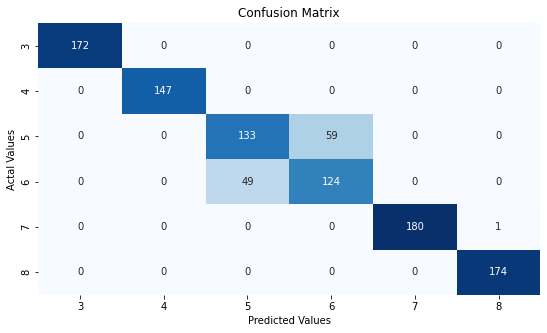

In [37]:
# display confusion matrix
%matplotlib inline

cm_df = pd.DataFrame(cm, index =[3, 4, 5, 6, 7, 8], columns= [3, 4, 5, 6, 7, 8])
plt.figure(figsize=(9,5))
sns.heatmap(cm_df, annot=True,cmap=plt.cm.Blues, cbar=False, fmt='d')
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()


## Confusion matrix summary
| Feature| TP| FN| FP| TN|
|---|---|---|---|---|
| 3 |172| 0| 0| 867|
| 4 |147| 0| 0| 892|
| 5| 133| 59| 49| 798|
| 6| 124| 49| 59| 808|
| 7| 180| 1| 0| 858|
| 8| 174| 0| 1| 864|

## DECISION TREE CLASSIFIER

In [39]:
from sklearn.tree import DecisionTreeClassifier
dc = DecisionTreeClassifier()

dc.fit(X_train, y_train)
y_pred = dc.predict(X_test)

print(classification_report(y_test,y_pred))

cm = confusion_matrix(y_test, y_pred)

              precision    recall  f1-score   support

           3       1.00      1.00      1.00       172
           4       1.00      1.00      1.00       147
           5       0.68      0.64      0.66       192
           6       0.62      0.66      0.64       173
           7       1.00      0.98      0.99       181
           8       0.98      1.00      0.99       174

    accuracy                           0.87      1039
   macro avg       0.88      0.88      0.88      1039
weighted avg       0.87      0.87      0.87      1039



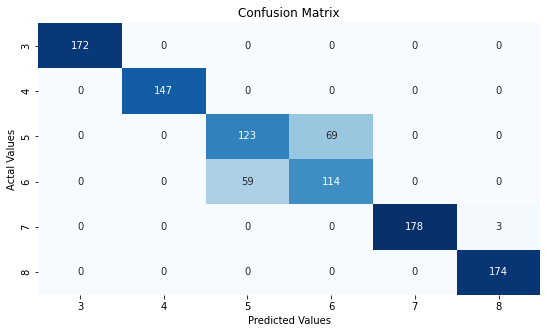

In [40]:
# display confusion matrix
%matplotlib inline

cm_df = pd.DataFrame(cm, index =[3, 4, 5, 6, 7, 8], columns= [3, 4, 5, 6, 7, 8])
plt.figure(figsize=(9,5))
sns.heatmap(cm_df, annot=True,cmap=plt.cm.Blues, cbar=False, fmt='d')
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()


## Confusion matrix summary
| Feature| TP| FN| FP| TN|
|---|---|---|---|---|
| 3 |172| 0| 0| 867|
| 4 |147| 0| 0| 892|
| 5| 123| 69| 59| 788|
| 6| 114| 59| 69| 797|
| 7| 178| 3| 0| 858|
| 8| 174| 0| 3| 862|
| SUM|908|131|131|5064


##### 